In [160]:
import numpy as np
from matplotlib import pylab as pl
from os import listdir
import imageio
import json
from HSM_WFN import *
import scipy
import time
from matplotlib.gridspec import GridSpec

%matplotlib inline

In [23]:
data_direc = '../../../20181005_SteadyLock/hwsdata/'
FileList = listdir(data_direc)

img_List = []

for i in range(len(FileList)):
    filename = data_direc+FileList[i]
    file = open(filename, encoding='utf-8')
    try:
        array =json.load(file)
    except:
        print("Couldn't Load " +filename +", maybe bad file?")
        continue
    #array_reshape = array.reshape([1024,1024])
    #f = np.flip(array_reshape,0)
    file.close()
    img_List.append(array)

In [112]:
img_gps = []
for i in range(len(FileList)):
    f = FileList[i].replace('ITMX_','')
    f = f.replace('.json','')
    img_gps.append(int(f))

In [24]:
img_List[0].keys()

dict_keys(['avImage', 'avGradients', 'optic', 'numberOfAvg'])

In [154]:
ifo_dir = '../../../20181005_SteadyLock/ifodata/'
ifo_List = listdir(ifo_dir)

keys = ['Time', 'Spherical Power']
data_ifo = []

data = np.loadtxt(ifo_dir+ifo_List[0])

data_ifo.append(data[:,0])
data_ifo.append(data[:,1])

dict_ifo = dict(zip(keys, data_ifo))

#times where we have hws data and ifo data
ifo_hws_times = []
for i in range(len(img_gps)):
    itemindex = np.where(dict_ifo['Time'][:]==img_gps[i])
    if len(itemindex[0]) != 0:
        ifo_hws_times.append(img_gps[i])
    else:
        continue

In [25]:
img_test = img_List[0]

x = y = range(0,1024,1)
X,Y = np.meshgrid(x,y)

In [51]:
def plot_raw(img):
    data = img['avImage']
    
    fig = pl.figure(figsize=(9, 6), dpi=80)

    ax1=fig.add_subplot(111) # Second row, span all columns
    c_range = range(0,500,20)
    pl.contourf(X,Y,data, c_range, cmap='plasma')
    pl.xlabel("X [Pixels]",fontsize=16)
    pl.ylabel("Y [Pixels]",fontsize=16)
    pl.grid()
    
    pl.colorbar()

In [183]:
ref = img_List[0]
cur = img_List[4]

# set up the numerical WF                                                                                                                       
limits = {'x': [-0.1, 0.1], 'y': [-0.1, 0.1]}                                                                                                   
spc = 0.2/200                                                                                                                                   
x_g,y_g = setup_grid(limits,spc)  

png_grad_files = []

def plot_grad(ref_img,cur_img,gps,direc,ifo_dict):
    
    ref_grad = np.array(ref_img['avGradients'])
    cur_grad = np.array(cur_img['avGradients'])

    U = +cur_grad[:,0]-ref_grad[:,0]
    V = +cur_grad[:,1]-ref_grad[:,1]
    U = U - np.mean(U)   # remove tilt                                                                                                              
    V = V - np.mean(V)
    rmsV = scipy.mean(scipy.sqrt(U**2 + V**2))

    # set up the numerical WF                                                                                                                                                                                                                                    
    cents = ref_grad[:,2:4] 
    grads = np.transpose(array([U,V]))

    #wf = -1E9*calculate_wf(cents,grads,limits,spc)                                                                                                  
    #wf = wf-np.max(wf[50:150,50:150])
    
    
    gs=GridSpec(3,2) # 3 rows, 2 columns
    
    fig = pl.figure(figsize=(18, 6), dpi=80)
    
    ax1=fig.add_subplot(gs[:,0])
    
    Q2 = pl.quiver(ref_grad[:,2], ref_grad[:,3], U, V, units='x', scale_units='height')

    pl.title('HWS gradient field.\n Current time = '+str(gps))
    pl.xlabel('X coordinate - HWS (m)')                                                                                                        
    pl.ylabel('Y coordinate - HWS (m)')                                                                                                        
    pl.xlim([-0.17, 0.17])                                                                                                                       
    pl.ylim([-0.17, 0.17])                                                                                                                       
                                                                                                                     
    pl.grid()
    
    # Determine how to track the linear plot with the gradient plot
    ifo_index = np.where(dict_ifo['Time'][:]==gps)
    ifo_index = int(ifo_index[0])
    
    start_index = int(np.where(dict_ifo['Time'][:]==ifo_hws_times[0])[0])

    
    ax2=fig.add_subplot(gs[0,1]) # First row, second column
    pl.plot(dict_ifo['Time'][start_index:ifo_index],dict_ifo['Spherical Power'][start_index:ifo_index])
    pl.grid()
    pl.xlim(dict_ifo['Time'][start_index],dict_ifo['Time'][-1])
    pl.ylim(min(dict_ifo['Spherical Power']),max(dict_ifo['Spherical Power']))
    
    pl.xlabel('Time (Seconds)')
    pl.ylabel('Spherical Power (Diopters)')
    
    save_file = direc+str(gps)+".png"
    png_grad_files.append(save_file)
    pl.savefig(save_file)

C:\Users\tvo88\Anaconda3\lib\site-packages\matplotlib\quiver.py:664: RuntimeWarning: divide by zero encountered in double_scalars
  length = a * (widthu_per_lenu / (self.scale * self.width))
C:\Users\tvo88\Anaconda3\lib\site-packages\matplotlib\quiver.py:664: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))
C:\Users\tvo88\Anaconda3\lib\site-packages\matplotlib\quiver.py:720: RuntimeWarning: invalid value encountered in less
  short = np.repeat(length < minsh, 8, axis=1)
C:\Users\tvo88\Anaconda3\lib\site-packages\matplotlib\quiver.py:734: RuntimeWarning: invalid value encountered in less
  tooshort = length < self.minlength
C:\Users\tvo88\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

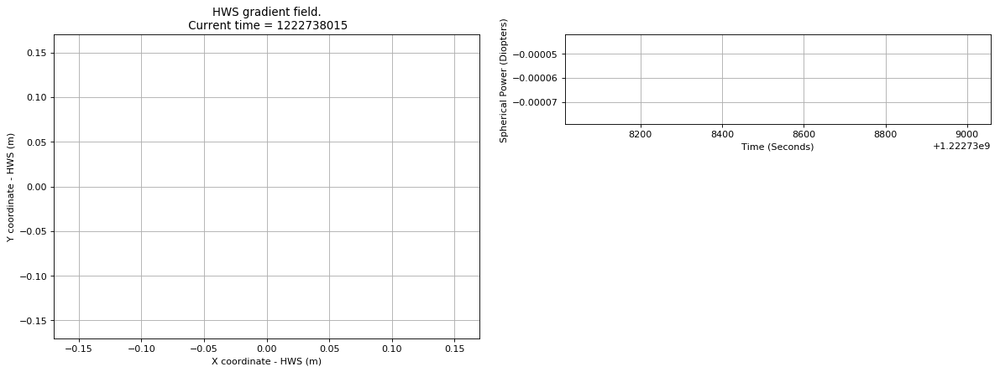

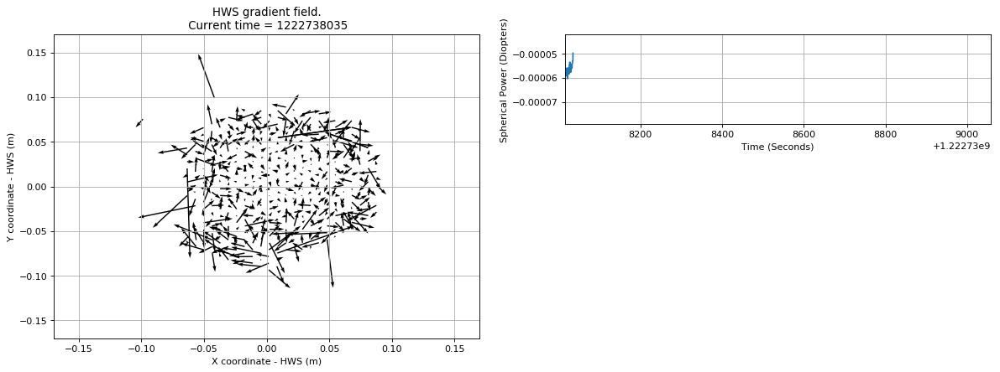

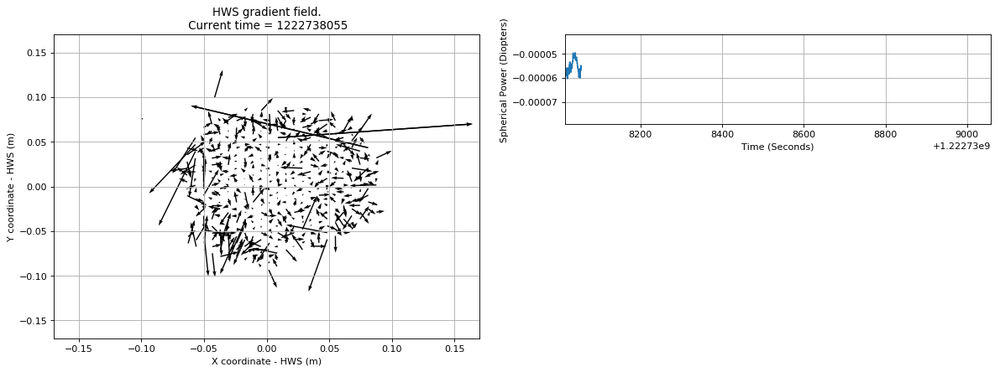

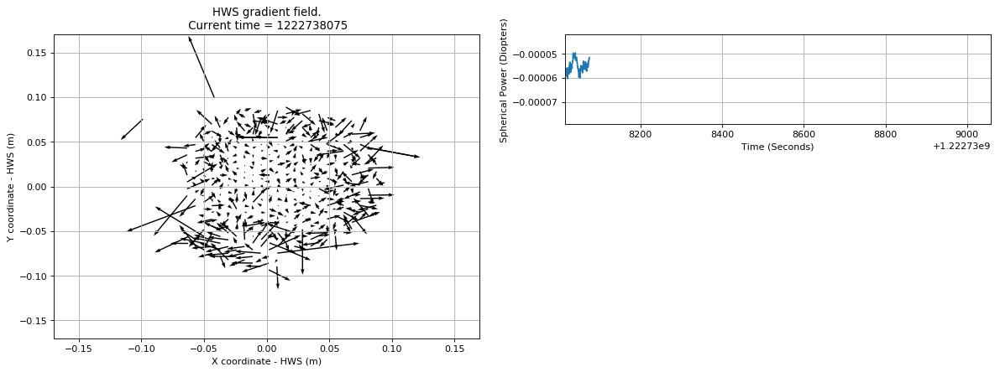

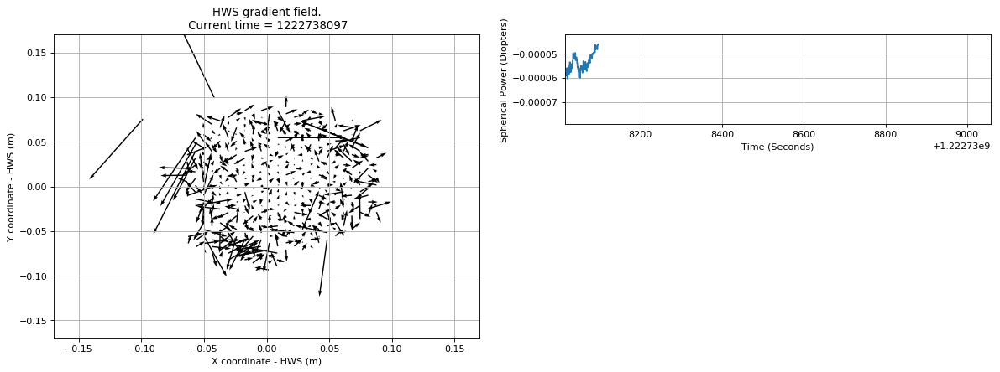

...

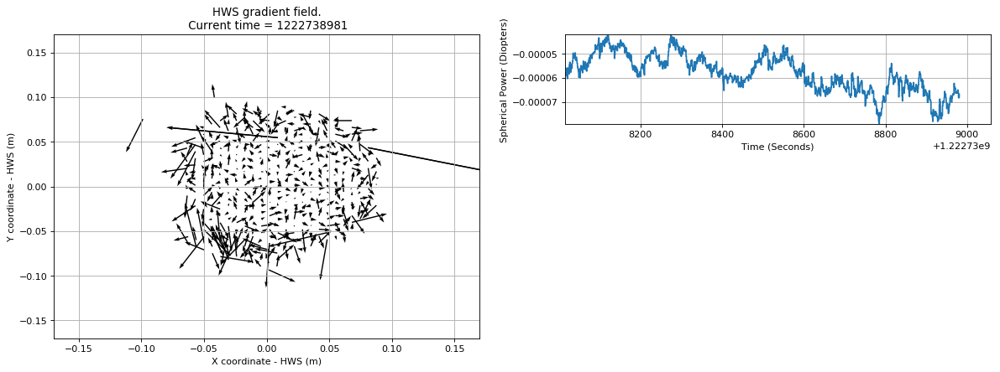

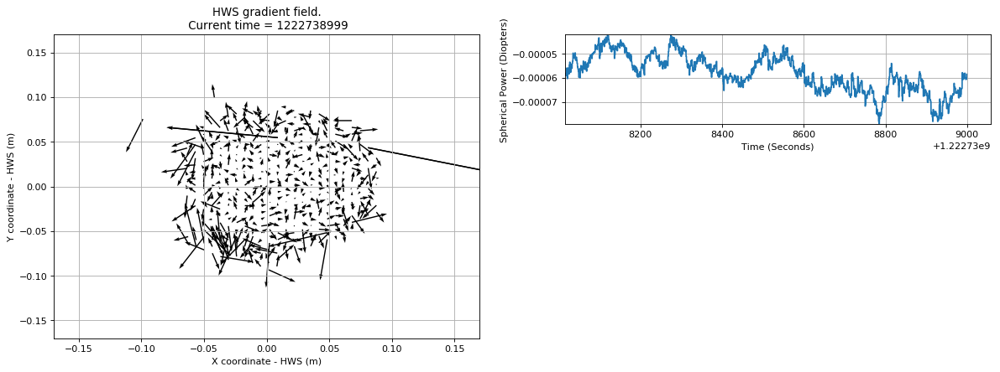

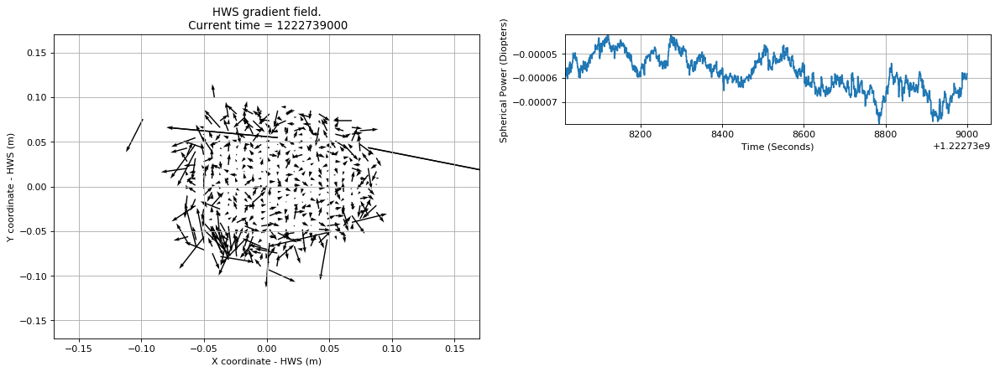

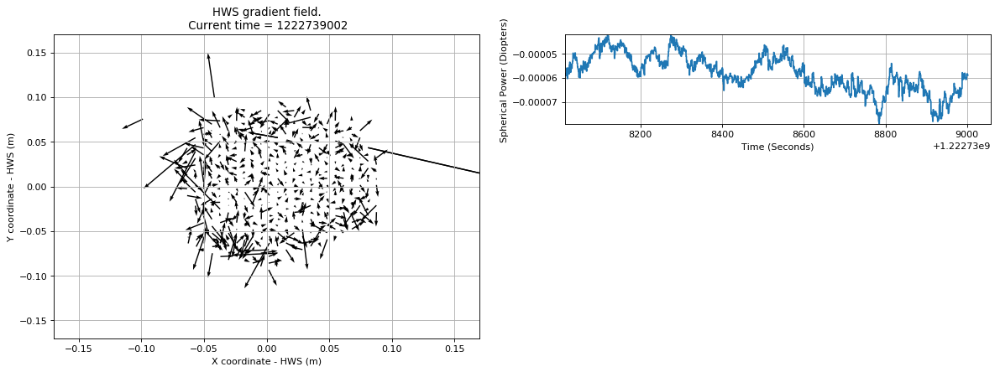

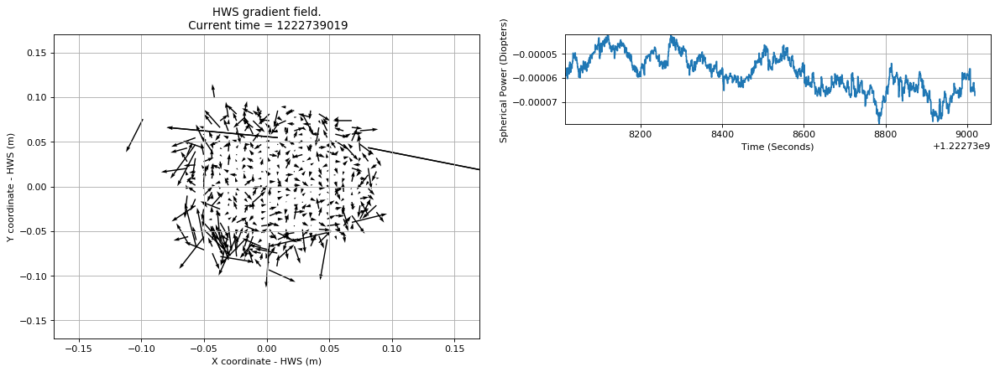

In [184]:
direc_png_grad = '../../../20181005_SteadyLock/grad_pngs/'

for i in range(len(img_gps)):
    plot_grad(img_List[0],img_List[i],img_gps[i],direc_png_grad,dict_ifo)

In [188]:
images = []
for i in range(len(png_grad_files)):
        images.append(imageio.imread(png_grad_files[i]))
imageio.mimsave('./20181005_SteadyLock_grads.gif', images,duration=.5)

In [96]:
range_max = int(round(wf.max())+15)
range_min = int(round(wf.min())-15)                                                                                                                                              
contourR = range(range_min,range_max,int((range_max-range_min)/20)) 

In [189]:
plot_intensity="""png_direc = '../../../20181005_SteadyLock/png/'
png_files = []

for i in range(len(img_List)):
    #plot_raw(img_List[i])

    #save_file = png_direc+FileList[i]+".png"
    #png_files.append(save_file)
    #pl.savefig(save_file)

images = []
for i in range(len(png_files)):
        images.append(imageio.imread(png_files[i]))
imageio.mimsave('./20181005_SteadyLock.gif', images)"""